In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/crime-cast-forecasting-crime-categories/sample.csv
/kaggle/input/crime-cast-forecasting-crime-categories/train.csv
/kaggle/input/crime-cast-forecasting-crime-categories/test.csv


Preprecessing

In [2]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, MultiLabelBinarizer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
train_df = pd.read_csv("/kaggle/input/crime-cast-forecasting-crime-categories/train.csv")
train_df.head()

,Location,Cross_Street,Latitude,Longitude,Date_Reported,Date_Occurred,Time_Occurred,Area_ID,Area_Name,Reporting_District_no,...,Victim_Age,Victim_Sex,Victim_Descent,Premise_Code,Premise_Description,Weapon_Used_Code,Weapon_Description,Status,Status_Description,Crime_Category
0,4500 CARPENTER AV,NaN,34.1522,-118.3910,03/09/2020 12:00:00 AM,03/06/2020 12:00:00 AM,1800.0,15.0,N Hollywood,1563.0,...,75.0,M,W,101.0,STREET,NaN,NaN,IC,Invest Cont,Property Crimes
1,45TH ST,ALAMEDA ST,34.0028,-118.2391,02/27/2020 12:00:00 AM,02/27/2020 12:00:00 AM,1345.0,13.0,Newton,1367.0,...,41.0,M,H,216.0,SWAP MEET,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,Property Crimes
2,600 E MARTIN LUTHER KING JR BL,NaN,34.0111,-118.2653,08/21/2020 12:00:00 AM,08/21/2020 12:00:00 AM,605.0,13.0,Newton,1343.0,...,67.0,M,B,501.0,SINGLE FAMILY DWELLING,NaN,NaN,IC,Invest Cont,Property Crimes
3,14900 ORO GRANDE ST,NaN,34.2953,-118.4590,11/08/2020 12:00:00 AM,11/06/2020 12:00:00 AM,1800.0,19.0,Mission,1924.0,...,61.0,M,H,101.0,STREET,NaN,NaN,IC,Invest Cont,Property Crimes
4,7100 S VERMONT AV,NaN,33.9787,-118.2918,02/25/2020 12:00:00 AM,02/25/2020 12:00:00 AM,1130.0,12.0,77th Street,1245.0,...,0.0,X,X,401.0,MINI-MART,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,Property Crimes


In [4]:
test_df= pd.read_csv("/kaggle/input/crime-cast-forecasting-crime-categories/test.csv")
test_df.head()

,Location,Cross_Street,Latitude,Longitude,Date_Reported,Date_Occurred,Time_Occurred,Area_ID,Area_Name,Reporting_District_no,...,Modus_Operandi,Victim_Age,Victim_Sex,Victim_Descent,Premise_Code,Premise_Description,Weapon_Used_Code,Weapon_Description,Status,Status_Description
0,1500 LEIGHTON AV,NaN,34.0128,-118.3045,03/03/2020 12:00:00 AM,03/03/2020 12:00:00 AM,2000.0,3.0,Southwest,376.0,...,0416 1241 1243 1813 1821 2000,28.0,F,H,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont
1,100 S NORMANDIE AV,NaN,34.0726,-118.3029,06/01/2020 12:00:00 AM,04/25/2020 12:00:00 AM,1700.0,20.0,Olympic,2014.0,...,0344 0394,26.0,M,B,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont
2,300 E 111TH ST,NaN,33.9348,-118.2695,08/28/2020 12:00:00 AM,08/27/2020 12:00:00 AM,900.0,18.0,Southeast,1844.0,...,1822 0701 1914 0355 1202 0100,62.0,F,B,721.0,HIGH SCHOOL,NaN,NaN,IC,Invest Cont
3,1300 S LA BREA AV,NaN,34.0497,-118.3442,12/23/2020 12:00:00 AM,12/03/2020 12:00:00 AM,2200.0,7.0,Wilshire,765.0,...,NaN,0.0,NaN,NaN,108.0,PARKING LOT,NaN,NaN,IC,Invest Cont
4,11000 MORRISON ST,NaN,34.1611,-118.3704,08/30/2020 12:00:00 AM,08/29/2020 12:00:00 AM,130.0,15.0,N Hollywood,1555.0,...,1501,37.0,F,W,501.0,SINGLE FAMILY DWELLING,NaN,NaN,AO,Adult Other


# Exploratory Data Analysis

In [5]:
train_df.isnull().sum()

Location                     0
Cross_Street             16552
Latitude                     0
Longitude                    0
Date_Reported                0
Date_Occurred                0
Time_Occurred                0
Area_ID                      0
Area_Name                    0
Reporting_District_no        0
Part 1-2                     0
Modus_Operandi            2741
Victim_Age                   0
Victim_Sex                2624
Victim_Descent            2624
Premise_Code                 0
Premise_Description          5
Weapon_Used_Code         12665
Weapon_Description       12665
Status                       0
Status_Description           0
Crime_Category               0
dtype: int64

In [6]:
train_df['Victim_Age'].value_counts()

Victim_Age
 0.0     4828
 30.0     448
 31.0     446
 26.0     442
 29.0     425
         ... 
 98.0       2
-2.0        2
 92.0       2
 96.0       2
 94.0       2
Name: count, Length: 100, dtype: int64

In [7]:
train_df['Weapon_Used_Code']

0          NaN
1        400.0
2          NaN
3          NaN
4        400.0
         ...  
19995    400.0
19996      NaN
19997      NaN
19998      NaN
19999      NaN
Name: Weapon_Used_Code, Length: 20000, dtype: float64

In [8]:
train_df.describe()

,Latitude,Longitude,Time_Occurred,Area_ID,Reporting_District_no,Part 1-2,Victim_Age,Premise_Code,Weapon_Used_Code
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,7335.000000
mean,33.940704,-117.893072,1352.380350,10.834250,1129.599200,1.418150,30.135000,297.176950,366.405044
std,2.126810,7.377726,646.100291,6.033166,603.330519,0.493267,21.863645,212.007298,120.485687
min,0.000000,-118.663400,1.000000,1.000000,101.000000,1.000000,-2.000000,101.000000,101.000000
25%,34.009200,-118.429700,930.000000,6.000000,632.000000,1.000000,12.000000,101.000000,312.000000
50%,34.058700,-118.323000,1430.000000,11.000000,1162.000000,1.000000,31.000000,203.000000,400.000000
75%,34.165025,-118.274400,1900.000000,16.000000,1622.000000,2.000000,46.000000,501.000000,400.000000
max,34.328100,0.000000,2359.000000,21.000000,2197.000000,2.000000,99.000000,969.000000,515.000000


In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Location               20000 non-null  object 
 1   Cross_Street           3448 non-null   object 
 2   Latitude               20000 non-null  float64
 3   Longitude              20000 non-null  float64
 4   Date_Reported          20000 non-null  object 
 5   Date_Occurred          20000 non-null  object 
 6   Time_Occurred          20000 non-null  float64
 7   Area_ID                20000 non-null  float64
 8   Area_Name              20000 non-null  object 
 9   Reporting_District_no  20000 non-null  float64
 10  Part 1-2               20000 non-null  float64
 11  Modus_Operandi         17259 non-null  object 
 12  Victim_Age             20000 non-null  float64
 13  Victim_Sex             17376 non-null  object 
 14  Victim_Descent         17376 non-null  object 
 15  Pr

In [10]:
train_df.columns

Index(['Location', 'Cross_Street', 'Latitude', 'Longitude', 'Date_Reported',
       'Date_Occurred', 'Time_Occurred', 'Area_ID', 'Area_Name',
       'Reporting_District_no', 'Part 1-2', 'Modus_Operandi', 'Victim_Age',
       'Victim_Sex', 'Victim_Descent', 'Premise_Code', 'Premise_Description',
       'Weapon_Used_Code', 'Weapon_Description', 'Status',
       'Status_Description', 'Crime_Category'],
      dtype='object')

Distribution of target variable

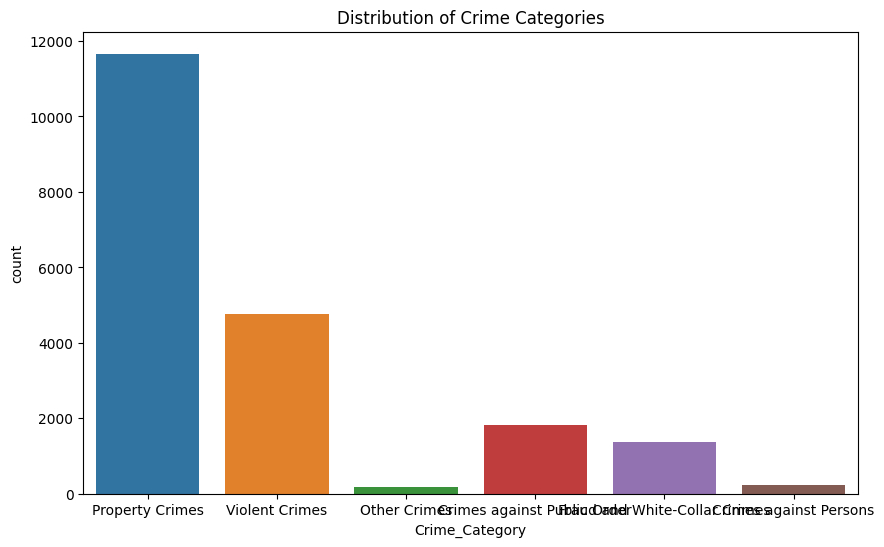

In [11]:
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='Crime_Category')
plt.title('Distribution of Crime Categories')
plt.show()

Correlation matrix

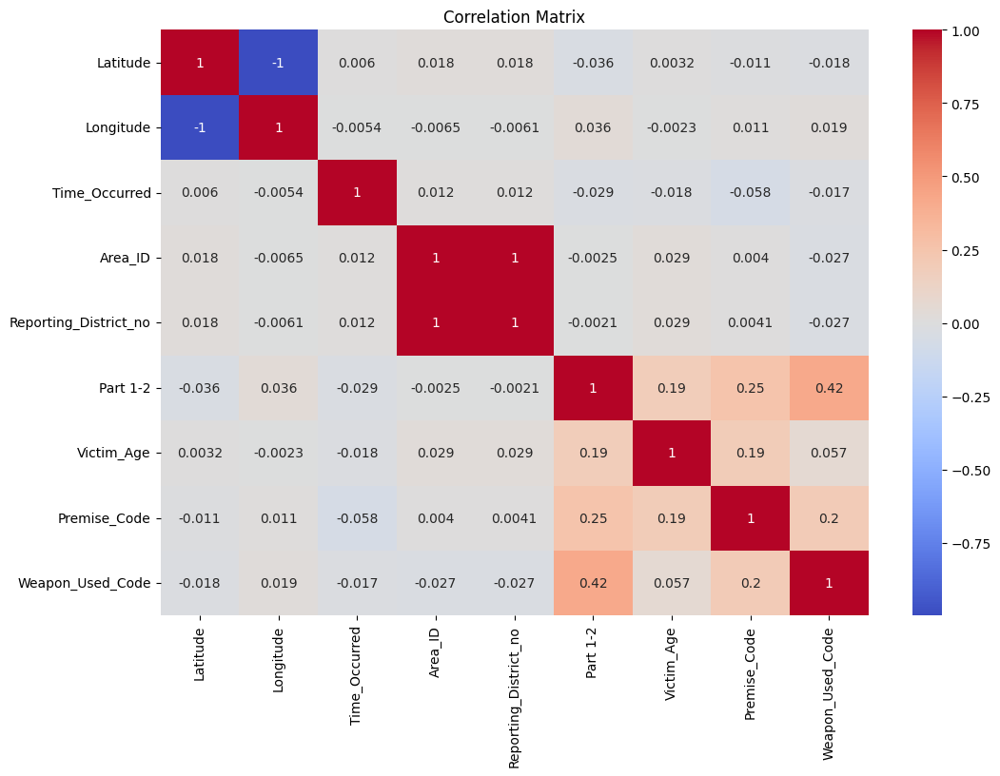

In [12]:
numeric_cols = train_df.select_dtypes(include=['float64', 'int64']).columns

plt.figure(figsize=(12, 8))
sns.heatmap(train_df[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Missing values heatmap

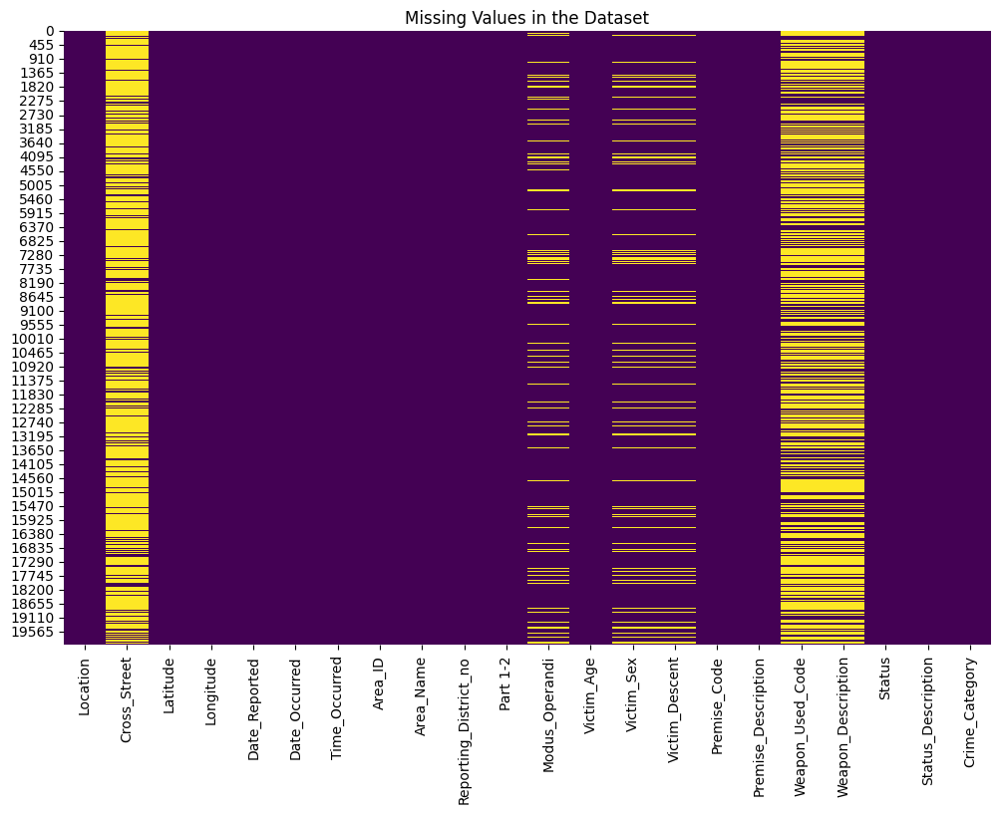

In [13]:
plt.figure(figsize=(12, 8))
sns.heatmap(train_df.isna(), cbar=False, cmap='viridis')
plt.title('Missing Values in the Dataset')
plt.show()

Distribution of numeric features

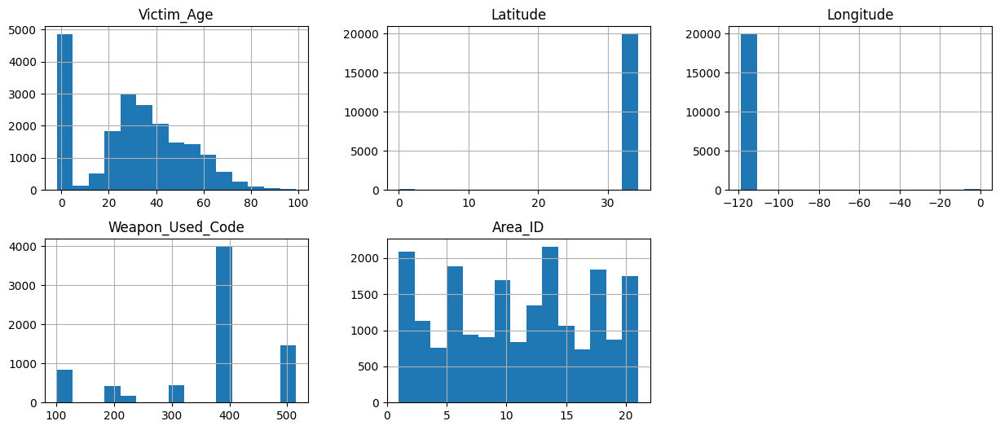

In [14]:
numeric_features = ['Victim_Age', 'Latitude', 'Longitude','Weapon_Used_Code','Area_ID']
train_df[numeric_features].hist(bins=15, figsize=(15, 6), layout=(2, 3))
plt.show()

Visualize categorical features

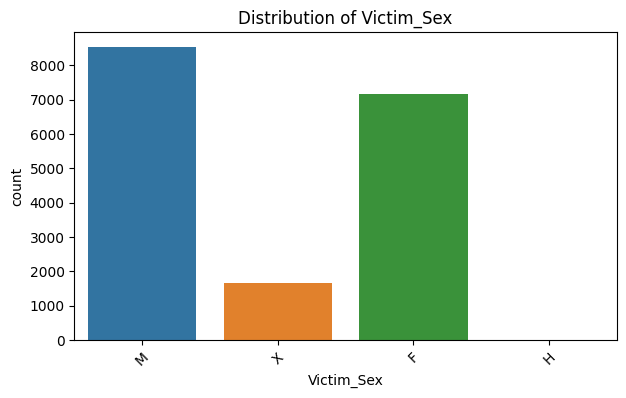

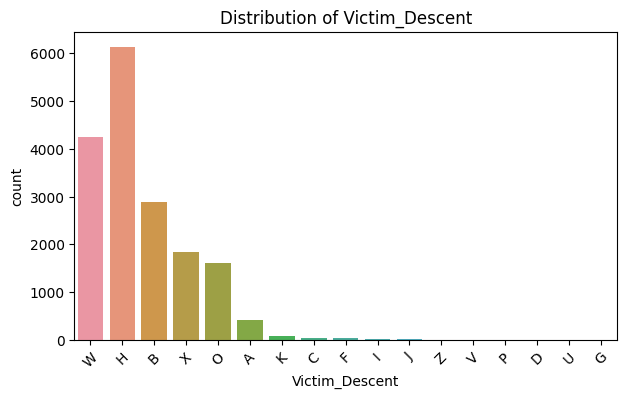

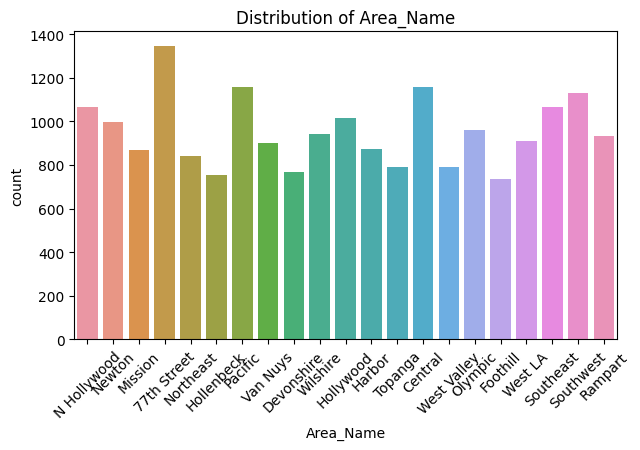

In [15]:
categorical_features = ['Victim_Sex', 'Victim_Descent', 'Area_Name']
for col in categorical_features:
    plt.figure(figsize=(7, 4))
    sns.countplot(data=train_df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()

# Preprocessing

Imputing Values

In [16]:
imputer_mf = SimpleImputer(strategy='most_frequent')
imputer_mean = SimpleImputer(strategy='mean')
train_df['Weapon_Used_Code'] = imputer_mean.fit_transform(train_df[['Weapon_Used_Code']])
test_df['Weapon_Used_Code'] = imputer_mean.fit_transform(test_df[['Weapon_Used_Code']])
train_df['Victim_Age'] = train_df['Victim_Age'].where(train_df['Victim_Age'] >= 0, np.nan)
test_df['Victim_Age'] = test_df['Victim_Age'].where(test_df['Victim_Age'] >= 0, np.nan)
train_df['Victim_Age'] = imputer_mean.fit_transform(train_df[['Victim_Age']])
test_df['Victim_Age'] = imputer_mean.fit_transform(test_df[['Victim_Age']])
mf_cols = ['Victim_Sex', 'Victim_Descent']
train_df[mf_cols] = imputer_mf.fit_transform(train_df[mf_cols])
test_df[mf_cols] = imputer_mf.fit_transform(test_df[mf_cols])

In [17]:
train_df['Victim_Age'].sample(20)

17706    42.0
9729     51.0
2438     23.0
13534    53.0
8645     25.0
2460     27.0
16910    19.0
17636    28.0
2711     64.0
6268      0.0
19254    48.0
239       0.0
6650     40.0
11284    36.0
12598     0.0
17440    55.0
5310     48.0
12173     0.0
13340     0.0
2630     44.0
Name: Victim_Age, dtype: float64

In [18]:
train_df.columns

Index(['Location', 'Cross_Street', 'Latitude', 'Longitude', 'Date_Reported',
       'Date_Occurred', 'Time_Occurred', 'Area_ID', 'Area_Name',
       'Reporting_District_no', 'Part 1-2', 'Modus_Operandi', 'Victim_Age',
       'Victim_Sex', 'Victim_Descent', 'Premise_Code', 'Premise_Description',
       'Weapon_Used_Code', 'Weapon_Description', 'Status',
       'Status_Description', 'Crime_Category'],
      dtype='object')

Converting Dates to Numeric

In [19]:
date_format = '%m/%d/%Y %I:%M:%S %p'
train_df['Date_Reported'] = pd.to_datetime(train_df['Date_Reported'], format=date_format)
train_df['Date_Occurred'] = pd.to_datetime(train_df['Date_Occurred'], format=date_format)
test_df['Date_Reported'] = pd.to_datetime(test_df['Date_Reported'], format=date_format)
test_df['Date_Occurred'] = pd.to_datetime(test_df['Date_Occurred'], format=date_format)

for df in [train_df, test_df]:
    df['Year_Reported'] = df['Date_Reported'].dt.year
    df['Month_Reported'] = df['Date_Reported'].dt.month
    df['Day_Reported'] = df['Date_Reported'].dt.day
    df['DayOfWeek_Reported'] = df['Date_Reported'].dt.dayofweek
    df['IsWeekend_Reported'] = df['Date_Reported'].dt.dayofweek >= 5
    df['Hour_Occurred'] = df['Date_Occurred'].dt.hour
    df['Year_Occurred'] = df['Date_Occurred'].dt.year
    df['Month_Occurred'] = df['Date_Occurred'].dt.month
    df['Day_Occurred'] = df['Date_Occurred'].dt.day


In [20]:
train_df = train_df.drop(['Date_Reported', 'Date_Occurred', 'Time_Occurred'], axis=1)
test_df = test_df.drop(['Date_Reported', 'Date_Occurred', 'Time_Occurred'], axis=1)

In [21]:
# Preprocess Cross_Street and Location columns with KNN Imputer
le = LabelEncoder()
X = train_df.drop('Crime_Category', axis='columns')
y = train_df['Crime_Category']

# Encode Cross_Street and Location for KNN Imputer
X['Cross_Street_enc'] = le.fit_transform(X['Cross_Street'].astype(str))
X['Location_enc'] = le.fit_transform(X['Location'].astype(str))
imputed_df = X[['Location_enc', 'Cross_Street_enc', 'Latitude', 'Longitude']]
knn_imputer = KNNImputer(n_neighbors=3)
imputed_data = knn_imputer.fit_transform(imputed_df)
imputed_df = pd.DataFrame(imputed_data, columns=['Location_enc', 'Cross_Street_enc', 'Latitude', 'Longitude'])
imputed_df['Cross_Street'] = le.inverse_transform(imputed_df['Cross_Street_enc'].round().astype(int))
imputed_df['Location'] = le.inverse_transform(imputed_df['Location_enc'].round().astype(int))
imputed_df.drop(columns=['Location_enc', 'Cross_Street_enc'], inplace=True)

X['Cross_Street'] = imputed_df['Cross_Street']
X['Location'] = imputed_df['Location']
X['Latitude'] = imputed_df['Latitude']
X['Longitude'] = imputed_df['Longitude']
X.drop(columns=['Cross_Street_enc', 'Location_enc'], inplace=True)

test_df['Cross_Street_enc'] = le.fit_transform(test_df['Cross_Street'].astype(str))
test_df['Location_enc'] = le.fit_transform(test_df['Location'].astype(str))
imputed_Test_df = test_df[['Location_enc', 'Cross_Street_enc', 'Latitude', 'Longitude']]
imputed_data = knn_imputer.fit_transform(imputed_Test_df)
imputed_Test_df = pd.DataFrame(imputed_data, columns=['Location_enc', 'Cross_Street_enc', 'Latitude', 'Longitude'])
imputed_Test_df['Cross_Street'] = le.inverse_transform(imputed_Test_df['Cross_Street_enc'].round().astype(int))
imputed_Test_df['Location'] = le.inverse_transform(imputed_Test_df['Location_enc'].round().astype(int))
imputed_Test_df.drop(columns=['Location_enc', 'Cross_Street_enc'], inplace=True)

test_df['Cross_Street'] = imputed_Test_df['Cross_Street']
test_df['Location'] = imputed_Test_df['Location']
test_df['Latitude'] = imputed_Test_df['Latitude']
test_df['Longitude'] = imputed_Test_df['Longitude']
test_df.drop(columns=['Cross_Street_enc', 'Location_enc'], inplace=True)

Modus Operandi with all values encoded

In [22]:
# Extract Modus Operandi columns
MO = X["Modus_Operandi"]
Test_MO = test_df["Modus_Operandi"]

# Function to split modus operandi strings into lists of integers
def MO_split_to_list(mo):
    if pd.isna(mo):
        return [0000]
    return [int(x) for x in mo.split()]

# Apply the function to training and test data
MO_new = MO.map(MO_split_to_list)
Test_MO_new = Test_MO.map(MO_split_to_list)

# Combine the Modus Operandi data to get all unique classes
combined_MO = pd.concat([MO_new, Test_MO_new])

# Fit the MultiLabelBinarizer on the combined data
mlb = MultiLabelBinarizer()
mlb.fit(combined_MO)

# Transform the training data
MO_enc = mlb.transform(MO_new)
X = X.drop(columns=["Modus_Operandi"])
MO_df = pd.DataFrame(MO_enc, columns=[f'MO_{i}' for i in range(MO_enc.shape[1])])
X = pd.concat([X, MO_df], axis=1)

# Transform the test data
Test_MO_enc = mlb.transform(Test_MO_new)
test_df = test_df.drop(columns=["Modus_Operandi"])
Test_MO_df = pd.DataFrame(Test_MO_enc, columns=[f'MO_{i}' for i in range(Test_MO_enc.shape[1])])
test_df = pd.concat([test_df, Test_MO_df], axis=1)

Drop unnecessary columns

In [23]:
X = X.drop(columns=['Weapon_Description', 'Premise_Description'])
test_df = test_df.drop(columns=['Weapon_Description', 'Premise_Description'])

Ordinal Encoding categorical variables

In [24]:
categorical_cols = ['Location', 'Cross_Street', 'Area_Name', 'Victim_Sex', 'Victim_Descent', 'Status', 'Status_Description']
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X[categorical_cols] = ordinal_encoder.fit_transform(X[categorical_cols])
test_df[categorical_cols] = ordinal_encoder.transform(test_df[categorical_cols])

One Hot Encoding Categorical Var

In [25]:
'''# Encode remaining categorical variables using OneHotEncoder
categorical_cols = ['Location', 'Cross_Street', 'Area_Name', 'Victim_Sex', 'Victim_Descent', 'Status', 'Status_Description']
onehot_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

# Create the column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', onehot_encoder, categorical_cols)
    ],
    remainder='passthrough'  # Keep other columns as they are
)

# Fit and transform the training data
X_encoded = preprocessor.fit_transform(X)

# Transform the test data
test_encoded = preprocessor.transform(test_df)


# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_encoded, y, test_size=0.2, random_state=42)'''

"# Encode remaining categorical variables using OneHotEncoder\ncategorical_cols = ['Location', 'Cross_Street', 'Area_Name', 'Victim_Sex', 'Victim_Descent', 'Status', 'Status_Description']\nonehot_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)\n\n# Create the column transformer\npreprocessor = ColumnTransformer(\n    transformers=[\n        ('cat', onehot_encoder, categorical_cols)\n    ],\n    remainder='passthrough'  # Keep other columns as they are\n)\n\n# Fit and transform the training data\nX_encoded = preprocessor.fit_transform(X)\n\n# Transform the test data\ntest_encoded = preprocessor.transform(test_df)\n\n\n# Split the data into training and validation sets\nX_train, X_val, y_train, y_val = train_test_split(X_encoded, y, test_size=0.2, random_state=42)"

# Model Training

Splitting the data

In [26]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

Gradient Boosting Model

In [27]:
'''# Initialize and train the model
model = GradientBoostingClassifier()
model.fit(X_train, y_train)'''

'# Initialize and train the model\nmodel = GradientBoostingClassifier()\nmodel.fit(X_train, y_train)'

In [28]:
'''# Make predictions and evaluate the model
y_pred = model.predict(X_val)
print(classification_report(y_val, y_pred))'''

'# Make predictions and evaluate the model\ny_pred = model.predict(X_val)\nprint(classification_report(y_val, y_pred))'

Model Comparison

In [29]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.metrics import classification_report

#GBModel
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
gb_pred = gb_model.predict(X_val)
print("Gradient Boosting Classifier Report:")
print(classification_report(y_val, gb_pred))
#XGB Model
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb_model.predict(X_val)
y_pred_xgb = label_encoder.inverse_transform(y_pred_xgb_encoded)
print("XGBoost Classifier Report:")
print(classification_report(y_val, y_pred_xgb))
#RFModel
rf_model= RandomForestClassifier()
rf_model.fit(X_train,y_train)
rf_pred = rf_model.predict(X_val)
print("Random Forest Classifier Report:")
print(classification_report(y_val, rf_pred))

Gradient Boosting Classifier Report:
                               precision    recall  f1-score   support

       Crimes against Persons       0.52      0.50      0.51        32
  Crimes against Public Order       0.84      0.85      0.85       374
Fraud and White-Collar Crimes       0.95      0.92      0.93       267
                 Other Crimes       0.50      0.29      0.36        35
              Property Crimes       0.99      0.99      0.99      2303
               Violent Crimes       0.93      0.95      0.94       989

                     accuracy                           0.95      4000
                    macro avg       0.79      0.75      0.76      4000
                 weighted avg       0.95      0.95      0.95      4000

XGBoost Classifier Report:
                               precision    recall  f1-score   support

       Crimes against Persons       0.68      0.72      0.70        32
  Crimes against Public Order       0.85      0.89      0.87       374
Fraud and

Bar plot for accuracy comparison (Model Comparison)

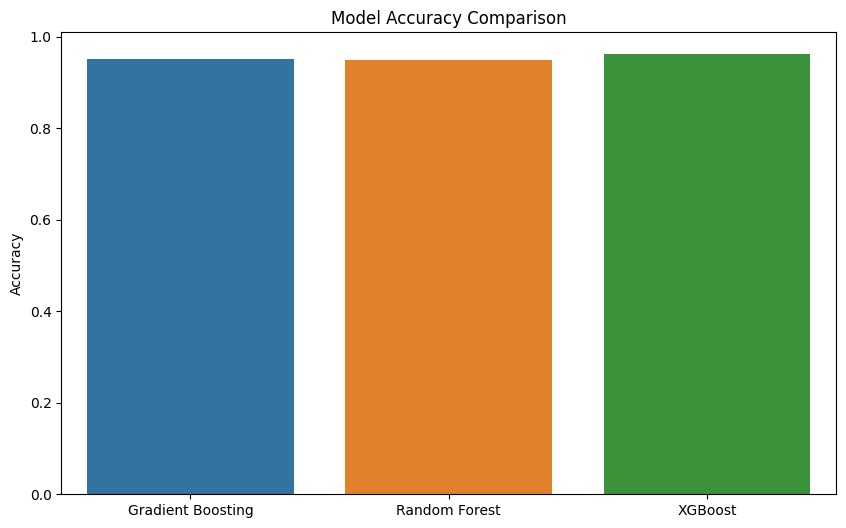

In [30]:
#accuracy scores

import numpy as np

gb_accuracy = np.mean(gb_pred == y_val)
rf_accuracy = np.mean(rf_pred == y_val)
xgb_accuracy = np.mean(y_pred_xgb == y_val)

model_accuracies = {
    'Gradient Boosting': gb_accuracy,
    'Random Forest': rf_accuracy,
    'XGBoost': xgb_accuracy
}

plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_accuracies.keys()), y=list(model_accuracies.values()))
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy')
plt.show()

Gradient Boosting Model with GridSearch CV HyperParameter Tuning

In [31]:
'''from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import randint, uniform

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 250],       # Number of boosting stages
    'learning_rate': [0.05, 0.1],    # Step size shrinkage
    'max_depth': [3, 5],                # Maximum depth of the individual regression estimators
    'min_samples_split': [2, 5],       # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 3],         # Minimum number of samples required to be at a leaf node
    'subsample': [0.8, 1.0],          # Fraction of samples to be used for fitting the individual base learners
    'max_features': ['auto', 'sqrt'] # Number of features to consider when looking for the best split
}

# Initialize the model
gb_model = GradientBoostingClassifier()

# Initialize GridSearchCV with cv=5
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)'''


'from sklearn.model_selection import GridSearchCV\nfrom sklearn.ensemble import GradientBoostingClassifier\nfrom scipy.stats import randint, uniform\n\n# Define the parameter grid\nparam_grid = {\n    \'n_estimators\': [100, 250],       # Number of boosting stages\n    \'learning_rate\': [0.05, 0.1],    # Step size shrinkage\n    \'max_depth\': [3, 5],                # Maximum depth of the individual regression estimators\n    \'min_samples_split\': [2, 5],       # Minimum number of samples required to split an internal node\n    \'min_samples_leaf\': [1, 3],         # Minimum number of samples required to be at a leaf node\n    \'subsample\': [0.8, 1.0],          # Fraction of samples to be used for fitting the individual base learners\n    \'max_features\': [\'auto\', \'sqrt\'] # Number of features to consider when looking for the best split\n}\n\n# Initialize the model\ngb_model = GradientBoostingClassifier()\n\n# Initialize GridSearchCV with cv=5\ngrid_search = GridSearchCV(estimat

In [32]:
'''from sklearn.metrics import classification_report

# Use the best estimator to make predictions
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_val)
print(classification_report(y_val, y_pred))'''

'from sklearn.metrics import classification_report\n\n# Use the best estimator to make predictions\nbest_model = grid_search.best_estimator_\ny_pred = best_model.predict(X_val)\nprint(classification_report(y_val, y_pred))'

XGBoost model w/o Hyperparameter tuning

In [33]:
'''from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import classification_report

# Encode the labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)

# Initialize the XGBoost model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Train the model
xgb_model.fit(X_train, y_train_encoded)

# Make predictions on the validation set
y_pred_xgb_encoded = xgb_model.predict(X_val)

# Decode the predictions
y_pred_xgb = label_encoder.inverse_transform(y_pred_xgb_encoded)

# Evaluate the model
print(classification_report(y_val, y_pred_xgb))'''


"from sklearn.preprocessing import LabelEncoder\nimport xgboost as xgb\nfrom sklearn.metrics import classification_report\n\n# Encode the labels\nlabel_encoder = LabelEncoder()\ny_train_encoded = label_encoder.fit_transform(y_train)\ny_val_encoded = label_encoder.transform(y_val)\n\n# Initialize the XGBoost model\nxgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')\n\n# Train the model\nxgb_model.fit(X_train, y_train_encoded)\n\n# Make predictions on the validation set\ny_pred_xgb_encoded = xgb_model.predict(X_val)\n\n# Decode the predictions\ny_pred_xgb = label_encoder.inverse_transform(y_pred_xgb_encoded)\n\n# Evaluate the model\nprint(classification_report(y_val, y_pred_xgb))"

Random Forest with HyperParameter Tuning

In [34]:
'''from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Initialize the Random Forest model
rf_model = RandomForestClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize the GridSearchCV
grid_search_rf = GridSearchCV(rf_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Train the model
grid_search_rf.fit(X_train, y_train)

# Get the best model
best_rf_model = grid_search_rf.best_estimator_

# Make predictions on the validation set
y_pred_rf = best_rf_model.predict(X_val)

# Evaluate the model
print(classification_report(y_val, y_pred_rf))'''

"from sklearn.ensemble import RandomForestClassifier\nfrom sklearn.model_selection import GridSearchCV\nfrom sklearn.metrics import classification_report\n\n# Initialize the Random Forest model\nrf_model = RandomForestClassifier()\n\n# Define the parameter grid\nparam_grid = {\n    'n_estimators': [100, 200, 300],\n    'max_depth': [None, 10, 20, 30],\n    'min_samples_split': [2, 5, 10],\n    'min_samples_leaf': [1, 2, 4],\n    'bootstrap': [True, False]\n}\n\n# Initialize the GridSearchCV\ngrid_search_rf = GridSearchCV(rf_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)\n\n# Train the model\ngrid_search_rf.fit(X_train, y_train)\n\n# Get the best model\nbest_rf_model = grid_search_rf.best_estimator_\n\n# Make predictions on the validation set\ny_pred_rf = best_rf_model.predict(X_val)\n\n# Evaluate the model\nprint(classification_report(y_val, y_pred_rf))"

In [35]:
test_df.isna().sum().sum()

0

KNN with Hyperparameter tuning

In [36]:
'''from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
param_grid = {'n_neighbors': [3, 5, 7, 9, 11]}
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_n_neighbors = grid_search.best_params_['n_neighbors']
print("Best n_neighbors:", best_n_neighbors)

# Evaluate the model
best_knn_model = grid_search.best_estimator_
y_pred = best_knn_model.predict(X_val)
print(classification_report(y_val, y_pred))'''

'from sklearn.neighbors import KNeighborsClassifier\nknn = KNeighborsClassifier()\nparam_grid = {\'n_neighbors\': [3, 5, 7, 9, 11]}\ngrid_search = GridSearchCV(knn, param_grid, cv=5, scoring=\'accuracy\')\ngrid_search.fit(X_train, y_train)\n\n# Best hyperparameters\nbest_n_neighbors = grid_search.best_params_[\'n_neighbors\']\nprint("Best n_neighbors:", best_n_neighbors)\n\n# Evaluate the model\nbest_knn_model = grid_search.best_estimator_\ny_pred = best_knn_model.predict(X_val)\nprint(classification_report(y_val, y_pred))'

SVC Model

In [37]:
'''from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Define the parameter grid for GridSearchCV
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['linear', 'rbf']
}

# Initialize and perform GridSearchCV for SVM
svm = SVC()
grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best parameters:", best_params)

# Evaluate the model
best_svm_model = grid_search.best_estimator_
y_pred = best_svm_model.predict(X_val)
print(classification_report(y_val, y_pred))'''

'from sklearn.svm import SVC\nfrom sklearn.model_selection import GridSearchCV\nfrom sklearn.metrics import classification_report\n\n# Define the parameter grid for GridSearchCV\nparam_grid = {\n    \'C\': [0.1, 1, 10, 100],\n    \'gamma\': [1, 0.1, 0.01, 0.001],\n    \'kernel\': [\'linear\', \'rbf\']\n}\n\n# Initialize and perform GridSearchCV for SVM\nsvm = SVC()\ngrid_search = GridSearchCV(svm, param_grid, cv=5, scoring=\'accuracy\')\ngrid_search.fit(X_train, y_train)\n\n# Best hyperparameters\nbest_params = grid_search.best_params_\nprint("Best parameters:", best_params)\n\n# Evaluate the model\nbest_svm_model = grid_search.best_estimator_\ny_pred = best_svm_model.predict(X_val)\nprint(classification_report(y_val, y_pred))'

Gradient Boosting Model with Randomized Search CV Hyperparameter tuning

In [38]:
'''from scipy.stats import randint, uniform
from sklearn.model_selection import RandomizedSearchCV
param_dist = {
    'n_estimators': randint(100, 250),
    'learning_rate': uniform(0.05, 0.15),
    'max_depth': randint(4,10),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 4),
    'subsample': uniform(0.6, 1.0),  
    'max_features': ['auto', 'sqrt'] 
}
model = GradientBoostingClassifier()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, 
                                   n_iter=40, scoring='accuracy', cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the random search model
random_search.fit(X_train, y_train)
print(f"Best parameters found: {random_search.best_params_}")
print(f"Best accuracy score found: {random_search.best_score_}")'''

'from scipy.stats import randint, uniform\nfrom sklearn.model_selection import RandomizedSearchCV\nparam_dist = {\n    \'n_estimators\': randint(100, 250),\n    \'learning_rate\': uniform(0.05, 0.15),\n    \'max_depth\': randint(4,10),\n    \'min_samples_split\': randint(2, 10),\n    \'min_samples_leaf\': randint(1, 4),\n    \'subsample\': uniform(0.6, 1.0),  \n    \'max_features\': [\'auto\', \'sqrt\'] \n}\nmodel = GradientBoostingClassifier()\n\n# Initialize RandomizedSearchCV\nrandom_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, \n                                   n_iter=40, scoring=\'accuracy\', cv=3, verbose=2, random_state=42, n_jobs=-1)\n\n# Fit the random search model\nrandom_search.fit(X_train, y_train)\nprint(f"Best parameters found: {random_search.best_params_}")\nprint(f"Best accuracy score found: {random_search.best_score_}")'

In [39]:
'''best_model = random_search.best_estimator_
y_pred = best_model.predict(X_val)
print(classification_report(y_val, y_pred))'''

'best_model = random_search.best_estimator_\ny_pred = best_model.predict(X_val)\nprint(classification_report(y_val, y_pred))'

Bagging GradientBoosting Model with RandomizedSearchCV Hyperparameter Tuning

In [40]:
'''from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define the parameter grid for Gradient Boosting
param_grid = {
    'n_estimators': randint(100, 250),
    'learning_rate': uniform(0.05, 0.15),
    'max_depth': randint(4, 10),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 4),
    'subsample': uniform(0.6, 1.0),
    'max_features': ['auto', 'sqrt']
}

# Initialize the Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Initialize RandomizedSearchCV for Gradient Boosting with cv=3
random_search = RandomizedSearchCV(estimator=gb_model, param_distributions=param_grid,
                                   n_iter=20, cv=3, n_jobs=-1, verbose=2, scoring='accuracy', random_state=42)

# Fit RandomizedSearchCV
random_search.fit(X_train, y_train)

# Get the best Gradient Boosting model
best_gb_model = random_search.best_estimator_

# Wrap the best Gradient Boosting model with Bagging
bagging_model = BaggingClassifier(base_estimator=best_gb_model, n_estimators=10, random_state=42)

# Train the Bagging model
bagging_model.fit(X_train, y_train)

# Evaluate the Bagging model
y_pred = bagging_model.predict(X_val)
print(classification_report(y_val, y_pred))
'''

"from sklearn.ensemble import BaggingClassifier\nfrom sklearn.ensemble import GradientBoostingClassifier\nfrom sklearn.model_selection import RandomizedSearchCV\nfrom scipy.stats import randint, uniform\n\n# Define the parameter grid for Gradient Boosting\nparam_grid = {\n    'n_estimators': randint(100, 250),\n    'learning_rate': uniform(0.05, 0.15),\n    'max_depth': randint(4, 10),\n    'min_samples_split': randint(2, 10),\n    'min_samples_leaf': randint(1, 4),\n    'subsample': uniform(0.6, 1.0),\n    'max_features': ['auto', 'sqrt']\n}\n\n# Initialize the Gradient Boosting model\ngb_model = GradientBoostingClassifier(random_state=42)\n\n# Initialize RandomizedSearchCV for Gradient Boosting with cv=3\nrandom_search = RandomizedSearchCV(estimator=gb_model, param_distributions=param_grid,\n                                   n_iter=20, cv=3, n_jobs=-1, verbose=2, scoring='accuracy', random_state=42)\n\n# Fit RandomizedSearchCV\nrandom_search.fit(X_train, y_train)\n\n# Get the best G

Stacking and Bagging Models with RandomizedSearchCV HyperParameter Tuning

In [41]:
from sklearn.ensemble import BaggingClassifier, StackingClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report
from scipy.stats import randint, uniform

# Parameters grid for Gradient Boosting
param_grid = {
    'n_estimators': randint(100, 200, 300),
    'learning_rate': uniform(0.01, 0.1),
    'max_depth': randint(3, 6, 10),
    'min_samples_split': randint(2, 5, 10),
    'min_samples_leaf': randint(1, 2, 4),
    'subsample': uniform(0.6, 1.0),
    'max_features': ['auto', 'sqrt']
}

gb_model = GradientBoostingClassifier(random_state=42)

random_search = RandomizedSearchCV(estimator=gb_model, param_distributions=param_grid,
                                   n_iter=20, cv=3, n_jobs=-1, verbose=2, scoring='accuracy', random_state=42)

random_search.fit(X_train, y_train)

best_gb_model = random_search.best_estimator_

# Base models
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
svc_model = SVC(probability=True, random_state=42)

# Bagged versions of the base models
bagged_gb = BaggingClassifier(base_estimator=best_gb_model, n_estimators=10, random_state=42)
bagged_rf = BaggingClassifier(base_estimator=rf_model, n_estimators=10, random_state=42)
bagged_svc = BaggingClassifier(base_estimator=svc_model, n_estimators=10, random_state=42)

# meta-model
meta_model = LogisticRegression()

# Stacking Classifier with bagged base models
stacking_model = StackingClassifier(
    estimators=[
        ('bagged_gb', bagged_gb),
        ('bagged_rf', bagged_rf),
        ('bagged_svc', bagged_svc)
    ],
    final_estimator=meta_model,
    cv=3  # Number of cross-validation folds
)

stacking_model.fit(X_train, y_train)

# Predictions and evaluating the Stacking model
y_pred = stacking_model.predict(X_val)
print(classification_report(y_val, y_pred))

Fitting 3 folds for each of 20 candidates, totalling 60 fits


/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/si

[CV] END learning_rate=0.047454011884736254, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=14, n_estimators=471, subsample=1.1986584841970367; total time=   0.1s
[CV] END learning_rate=0.07011150117432088, max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=12, n_estimators=401, subsample=1.3219987722668247; total time=   0.1s
[CV] END learning_rate=0.10385527090157502, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=12, n_estimators=432, subsample=0.9042422429595377; total time= 1.8min
[CV] END learning_rate=0.014666566321361544, max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=13, n_estimators=446, subsample=1.2183860093330874; total time=   0.0s
[CV] END learning_rate=0.014666566321361544, max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=13, n_estimators=446, subsample=1.2183860093330874; total time=   0.0s
[CV] END learning_rate=0.014666566321361544, max_depth=15, max_feat

/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/opt/conda/lib/python3.10/si

[CV] END learning_rate=0.047454011884736254, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=14, n_estimators=471, subsample=1.1986584841970367; total time=   0.1s
[CV] END learning_rate=0.025601864044243652, max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=14, n_estimators=474, subsample=1.4661761457749352; total time=   0.1s
[CV] END learning_rate=0.10385527090157502, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=12, n_estimators=432, subsample=0.9042422429595377; total time= 1.8min
[CV] END learning_rate=0.062475643163223786, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=14, n_estimators=458, subsample=0.9998609717152555; total time=21.9min
[CV] END learning_rate=0.07832635188254582, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=14, n_estimators=434, subsample=1.509320402078782; total time=   0.0s
[CV] END learning_rate=0.07832635188254582, max_depth=13, max_featur

Stacking, Bagging & MultiLayerPerceptron Algorithm with RandomizedSearchCV Hyperparameter tuning

In [42]:
'''from sklearn.ensemble import BaggingClassifier, StackingClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report
from scipy.stats import randint, uniform

# Define the parameter grid for Gradient Boosting
param_grid = {
    'n_estimators': randint(100, 250),
    'learning_rate': uniform(0.05, 0.15),
    'max_depth': randint(3, 10),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 4),
    'subsample': uniform(0.6, 1.0),
    'max_features': ['auto', 'sqrt']
}

# Initialize the Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Initialize RandomizedSearchCV for Gradient Boosting
random_search = RandomizedSearchCV(estimator=gb_model, param_distributions=param_grid,
                                   n_iter=20, cv=3, n_jobs=-1, verbose=2, scoring='accuracy', random_state=42)

# Fit RandomizedSearchCV
random_search.fit(X_train, y_train)

# Get the best Gradient Boosting model
best_gb_model = random_search.best_estimator_

# Define other base models
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
svc_model = SVC(probability=True, random_state=42)
mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, alpha=1e-4,
                          solver='adam', verbose=10, tol=1e-4, random_state=42,
                          learning_rate_init=0.001)

# Create Bagged versions of the base models
bagged_gb = BaggingClassifier(base_estimator=best_gb_model, n_estimators=10, random_state=42)
bagged_rf = BaggingClassifier(base_estimator=rf_model, n_estimators=10, random_state=42)
bagged_svc = BaggingClassifier(base_estimator=svc_model, n_estimators=10, random_state=42)

# Define the meta-model
meta_model = LogisticRegression()

# Define the Stacking Classifier with bagged base models
stacking_model = StackingClassifier(
    estimators=[
        ('bagged_gb', bagged_gb),
        ('bagged_rf', bagged_rf),
        ('bagged_svc', bagged_svc),
        ('mlp', mlp_model)  # Add MLP as one of the base models
    ],
    final_estimator=meta_model,
    cv=3  # Number of cross-validation folds
)

# Train the Stacking model
stacking_model.fit(X_train, y_train)

# Make predictions and evaluate the Stacking model
y_pred = stacking_model.predict(X_val)
print(classification_report(y_val, y_pred))'''

"from sklearn.ensemble import BaggingClassifier, StackingClassifier\nfrom sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier\nfrom sklearn.linear_model import LogisticRegression\nfrom sklearn.svm import SVC\nfrom sklearn.neural_network import MLPClassifier\nfrom sklearn.model_selection import train_test_split, RandomizedSearchCV\nfrom sklearn.metrics import classification_report\nfrom scipy.stats import randint, uniform\n\n# Define the parameter grid for Gradient Boosting\nparam_grid = {\n    'n_estimators': randint(100, 250),\n    'learning_rate': uniform(0.05, 0.15),\n    'max_depth': randint(3, 10),\n    'min_samples_split': randint(2, 10),\n    'min_samples_leaf': randint(1, 4),\n    'subsample': uniform(0.6, 1.0),\n    'max_features': ['auto', 'sqrt']\n}\n\n# Initialize the Gradient Boosting model\ngb_model = GradientBoostingClassifier(random_state=42)\n\n# Initialize RandomizedSearchCV for Gradient Boosting\nrandom_search = RandomizedSearchCV(estimator=gb_

test prediction

In [43]:
test_pred = stacking_model.predict(test_df)

test pred for XGBoost

In [44]:
'''test_predictions_encoded = xgb_model.predict(test_df)
test_pred = label_encoder.inverse_transform(test_predictions_encoded)'''

'test_predictions_encoded = xgb_model.predict(test_df)\ntest_pred = label_encoder.inverse_transform(test_predictions_encoded)'

In [45]:
#sample_df = pd.read_csv("/kaggle/input/crime-cast-forecasting-crime-categories/sample.csv")

creating submission.csv

In [46]:

submission = pd.DataFrame({"ID": np.arange(1,5001), 
                           "Crime_Category": test_pred,
                          }
                         ) 

submission.to_csv('submission.csv',index=False)